# 1.3 - Vector - Geopandas Geoprocessing Tools

# Intro

# Objectives

By following this tutorial you will be able to achieve this result

<p align="center">
  <img src="../docs/assets/result_watershed.png" >
</p>

# Setup

In [2]:
import geopandas as gpd
import geodatasets
import  folium

# Read data

In [3]:
df_estados = gpd.read_file('../data/vector/BR_UF_2022.zip')
df_rain_stations = gpd.read_file('../data/vector/Estacoes_Fluviometricas_e_Pluviometricas_da_Rede.gpkg')

# Attribute joins
- SQL tabular data like join
- join vs merge:
    - join uses the dataframe index as key by default
    - merge requires that user pass the columns that will by used as key
- Standard join types:
    - inner: keep only elements where the key is present in both tables
    - left: keep all rows from left table and add
    - outer:
    
- Other types:
    - anti-join:

- Validate
Geopandas and pandas join and merge function have a usefull argument to avoid inadvertent data duplicates
    - '1:1': one to one relationship
    - '1:m': one to many relationship
    - 'm:1': many to one relationship

In [4]:
# Create UF column to use as key on join with df_rain_stations
df_estados['UF'] = df_estados['NM_UF'].str.upper()

In [5]:
# Create UF as index
df_estados.index = df_estados['NM_UF'].str.upper()

In [6]:
# Total number of rain stations by UF
df_qtd_stations = df_rain_stations.groupby('UF').agg(qtd = ('OBJECTID', 'count'))

### Using merge


In [7]:
df_att_join = df_estados.merge(df_qtd_stations, on = 'UF', how= 'inner', validate='1:1')

In [8]:
df_att_join.head()

,CD_UF,NM_UF,SIGLA_UF,NM_REGIAO,AREA_KM2,geometry,UF,qtd
0,12,Acre,AC,Norte,164173.429,"POLYGON ((-68.79282 -10.99957, -68.79367 -10.9...",ACRE,149
1,13,Amazonas,AM,Norte,1559255.881,"POLYGON ((-56.76292 -3.23221, -56.76789 -3.242...",AMAZONAS,552
2,15,Pará,PA,Norte,1245870.704,"MULTIPOLYGON (((-48.97548 -0.19834, -48.97487 ...",PARÁ,849
3,16,Amapá,AP,Norte,142470.762,"MULTIPOLYGON (((-51.04561 -0.05088, -51.05422 ...",AMAPÁ,150
4,17,Tocantins,TO,Norte,277423.627,"POLYGON ((-48.24830 -13.19239, -48.24844 -13.1...",TOCANTINS,594



### Using join


In [9]:
df_att_join = df_estados.join(df_qtd_stations, how= 'inner', validate='1:1')

<Axes: >

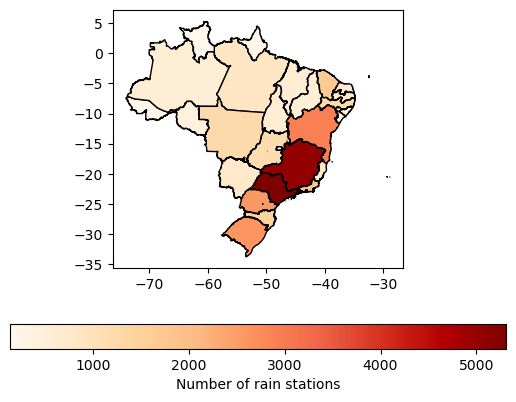

In [10]:
df_att_join.plot(column="qtd", cmap="OrRd", edgecolor="k", legend=True,
                 legend_kwds={"label": "Number of rain stations", "orientation": "horizontal"})

In [11]:
type(df_att_join)

geopandas.geodataframe.GeoDataFrame

# Spatial joins

<Axes: >

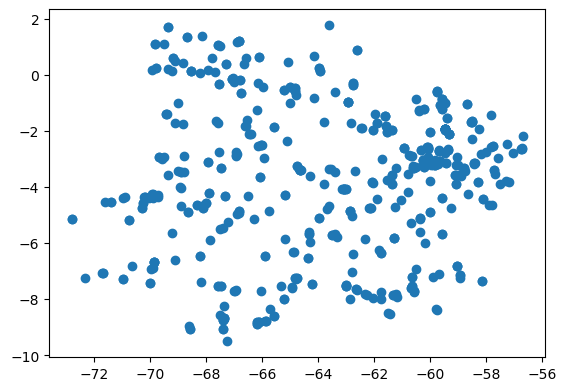

In [12]:
df_rain_stations.sjoin(df_estados[df_estados['UF']=='AMAZONAS']).plot()

# Overlay operations
<p align="center">
  <img src="../docs/assets/overlay_operations.png" >
</p>

source: [geopandas user guide](https://geopandas.org/en/stable/docs/user_guide/set_operations.html)

In [13]:
df_jaguari_basin = gpd.read_file('../data/vector/ide_0102_pj_otto_bacia_pol.zip')
# Filter the drainage area of Jaguari river
df_jaguari_basin = df_jaguari_basin[df_jaguari_basin['nunivotto5'].isin(['86669'])]

In [14]:
df_watershed = df_jaguari_basin[df_jaguari_basin['nunivotto6'].isin(['866696'])]

In [15]:
df_drenagem = gpd.read_file('../data/vector/ide_0101_pj_hidro_otto_lin.zip')
# df_drenagem.plot()

In [16]:
df_watershed_drain = gpd.overlay(df_drenagem, df_watershed, how='intersection', make_valid=True, keep_geom_type=True)


# Clip polygons

In [17]:
df_watershed_drain = gpd.clip(df_drenagem, df_watershed)

# Dissolve and Union
The output is equivalent, dissolve works on a single dataframe and union is used in two objects

In [18]:
df_watershed = df_watershed.dissolve()

# Buffer

<p align="center">
  <img src="../docs/assets/buffer.png" >
</p>

source: [geopandas user guide](https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoSeries.buffer.html)

To use the buffer correctly, as a rule it is necessary to project the data for a metric system. Otherwise you will receive a message: "Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect".

However, for demonstration purposes, I will use the rule of thumb: at the equator, one minute of latitude or longitude is ~ 1.84 km.

In [30]:
m = df_watershed_drain.buffer(36e-5).explore(color = '#90EE90')

style1 = { 'fillColor': '#00FFFF', 'color': '#00FFFF', 'alpha' : '.5'}
style2 = { 'fillColor': 'None', 'color': '#C70039'}

new_layer = folium.GeoJson(df_watershed_drain) # ~90m
new_layer.add_to(m)
new_layer_2 = folium.GeoJson(df_watershed, style_function=lambda x:style2)
new_layer_2.add_to(m)

C:\Users\lucas.pontes\AppData\Local\Temp\ipykernel_10844\3221997381.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = df_watershed_drain.buffer(36e-5).explore(color = '#90EE90')


In [31]:
m

# Difference
<p align="center">
  <img src="../docs/assets/binary_geo-difference.svg" >
</p>

source: [geopandas user guide](https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoSeries.difference.html)

In [ ]:
df_watershed_drain.buffer(36e-5).difference(df_watershed_drain.buffer(36e-6)).explore()